# Market explorer

Per-market plots and diagnostics for the 12 fetched Polymarket markets.

Layout:
1. **Summary table** — per-market tier, fit parameters, observation-length-vs-timescale ratio.
2. **Grid overview** — small multiples of the price logit `z(t)` for all markets, color-coded by tier.
3. **Detailed per-market view** — for each market, a 4-panel breakdown: raw + bars, `z(t)` with OU attractor, ACF + fitted exponential, distribution of `z` values.

Tiers (see §5.2 of the paper draft):
- `stable_OU` — n_timescales ≥ 10, OU is descriptively valid.
- `borderline` — 5 ≤ n_timescales < 10.
- `resolution_process` — n_timescales < 5; the observation window is dominated by the resolution itself, ψ̄ is non-stationary, OU constant-attractor fit is misleading.
- `poor_fit` — R² < 0.85 on log-ACF, or < 5 lags used.
- `uninformative` — too few bars after preprocessing, or z variance too small.

In [8]:
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline
plt.rcParams['figure.dpi'] = 110
pd.set_option('display.width', 200)
pd.set_option('display.max_colwidth', 60)

In [9]:
RAW = Path('../data/raw')
PROC = Path('../data/processed')

with open(RAW / 'markets.json') as f:
    metadata = json.load(f)
with open(PROC / 'summary.json') as f:
    summaries = json.load(f)
with open(PROC / 'mom_fits.json') as f:
    fits_list = json.load(f)

metadata_by_token = {m['token_id']: m for m in metadata}
summary_by_token = {s['token_id']: s for s in summaries}
fits_by_token = {f['token_id']: f for f in fits_list}

print(f'corpus: {len(metadata)} markets')
print(f'  with preprocessing summary: {len(summary_by_token)}')
print(f'  with OU fit:                {len(fits_by_token)}')

corpus: 92 markets
  with preprocessing summary: 92
  with OU fit:                68


## Summary table

Each market's preprocessing stats, OU fit parameters, and tier. Tier is computed from observation-length-vs-mean-reversion-timescale (`n_timescales = span_h · κ̂`) and fit quality.

In [10]:
def n_timescales(fit, summary):
    if not fit or fit['kappa_hat_per_hour'] <= 0:
        return float('nan')
    return summary['span_hours'] * fit['kappa_hat_per_hour']


def tier_for(fit, summary):
    n_bars = summary['n_bars_after_saturation_drop']
    if n_bars < 20:
        return 'uninformative'
    if not fit:
        return 'uninformative'
    if fit['log_acf_r2'] < 0.85 or fit['fit_lags_used'] < 5:
        return 'poor_fit'
    n_ts = n_timescales(fit, summary)
    if n_ts < 5:
        return 'resolution_process'
    if n_ts < 10:
        return 'borderline'
    return 'stable_OU'


rows = []
for m in metadata:
    token = m['token_id']
    summ = summary_by_token.get(token)
    if summ is None:
        continue
    fit = fits_by_token.get(token)
    n_ts = n_timescales(fit, summ) if fit else float('nan')
    if fit:
        sig_st = fit['sigma_z_stationary']
        sig_inc = fit['sigma_z_increments']
        sig_disagree = abs(sig_st - sig_inc) / max(abs(sig_st), 1e-9) * 100
    else:
        sig_disagree = float('nan')
    rows.append({
        'tier': tier_for(fit, summ),
        'out': m['outcome'],
        'n_bars': summ['n_bars_after_saturation_drop'],
        'span_h': round(summ['span_hours'], 1),
        'kappa': round(fit['kappa_hat_per_hour'], 4) if fit else None,
        'tau_h': round(1 / fit['kappa_hat_per_hour'], 1) if fit and fit['kappa_hat_per_hour'] > 0 else None,
        'n_timescales': round(n_ts, 1) if not np.isnan(n_ts) else None,
        'psi_hat': round(fit['psi_hat'], 3) if fit else None,
        'r2': round(fit['log_acf_r2'], 3) if fit else None,
        'sig_disagree_%': round(sig_disagree, 1) if not np.isnan(sig_disagree) else None,
        'question': m['question'][:50],
        'token_id': token,
    })

tier_order = {'stable_OU': 0, 'borderline': 1, 'resolution_process': 2,
              'poor_fit': 3, 'uninformative': 4}
df = pd.DataFrame(rows)
df['_tier_rank'] = df['tier'].map(tier_order)
df = df.sort_values(['_tier_rank', 'n_timescales'], ascending=[True, False]).drop(columns='_tier_rank')
df.reset_index(drop=True, inplace=True)
df.drop(columns='token_id')

,tier,out,n_bars,span_h,kappa,tau_h,n_timescales,psi_hat,r2,sig_disagree_%,question
0,stable_OU,YES,128,127.0,1.3722,0.7,174.3,-0.877,0.890,20.5,Timberwolves vs. Nuggets
1,stable_OU,YES,475,474.0,0.2346,4.3,111.2,-1.844,0.910,55.4,Will a U.S. anti-cartel operation outside of the U
2,stable_OU,YES,161,160.0,0.6260,1.6,100.2,1.063,0.988,19.6,Celtics vs. 76ers
3,stable_OU,NO,167,166.0,0.4748,2.1,78.8,0.498,0.976,11.5,Spurs vs. Timberwolves
4,stable_OU,NO,152,307.0,0.2322,4.3,71.3,-4.353,0.918,2.7,Will La U win the third most seats in the 2026 Col
...,...,...,...,...,...,...,...,...,...,...,...
87,uninformative,YES,39,38.0,NaN,NaN,NaN,NaN,NaN,NaN,Trail Blazers vs. Suns
88,uninformative,YES,240,239.0,NaN,NaN,NaN,NaN,NaN,NaN,Will Real Madrid CF win on 2026-04-21?
89,uninformative,NO,99,98.0,NaN,NaN,NaN,NaN,NaN,NaN,Indian Premier League: Mumbai Indians vs Sunrisers
90,uninformative,NO,28,27.0,NaN,NaN,NaN,NaN,NaN,NaN,Magic vs. Celtics


In [11]:
df['tier'].value_counts().reindex(['stable_OU', 'borderline', 'resolution_process', 'poor_fit', 'uninformative'])

tier
stable_OU             45
borderline            14
resolution_process     4
poor_fit               5
uninformative         24
Name: count, dtype: int64

## Grid overview — z(t) for all markets

Small multiples sorted by tier. Each panel shows the processed price logit `z(t)`. Red dashed line is the OU attractor `ψ̂`. The shaded band is `±1σ` from the stationary OU variance (a heuristic; not meaningful for non-stationary tiers).

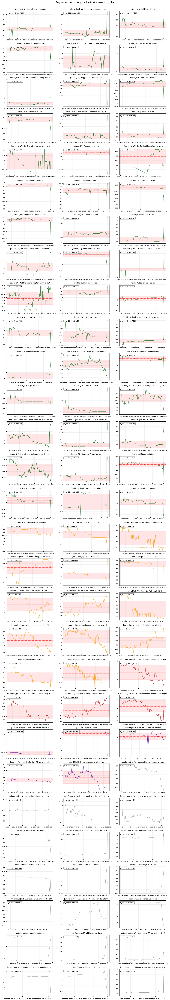

In [12]:
TIER_COLORS = {
    'stable_OU': '#2e7d32',
    'borderline': '#f9a825',
    'resolution_process': '#c62828',
    'poor_fit': '#6a1b9a',
    'uninformative': '#9e9e9e',
}

viewable = df[df['n_bars'] >= 20].reset_index(drop=True)
n = len(viewable)
cols = 3
rows_count = (n + cols - 1) // cols

fig, axes = plt.subplots(rows_count, cols, figsize=(13, 2.6 * rows_count))
axes_flat = axes.flat if hasattr(axes, 'flat') else [axes]

for i, row in viewable.iterrows():
    ax = axes_flat[i]
    token = row['token_id']
    proc = pd.read_csv(PROC / f'{token}.csv')
    dt_idx = pd.to_datetime(proc['t_bar'], unit='s')
    ax.plot(dt_idx, proc['z'], lw=0.8, color=TIER_COLORS[row['tier']])
    if row['psi_hat'] is not None:
        ax.axhline(row['psi_hat'], color='red', lw=0.8, ls='--', alpha=0.7)
        if row['kappa'] is not None and row['kappa'] > 0:
            sig_st = fits_by_token[token]['sigma_z_stationary']
            stationary_std = np.sqrt(sig_st ** 2 / (2 * row['kappa']))
            ax.axhspan(row['psi_hat'] - stationary_std, row['psi_hat'] + stationary_std,
                       color='red', alpha=0.10)
    ax.set_title(f"[{row['tier']}] {row['question'][:36]}", fontsize=9)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.2)
    if row['n_timescales'] is not None:
        ax.text(0.02, 0.95,
                f"n_ts={row['n_timescales']}, out={row['out']}",
                transform=ax.transAxes, fontsize=8, va='top',
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='gray', alpha=0.8))

for j in range(i + 1, rows_count * cols):
    axes_flat[j].axis('off')

fig.suptitle('Polymarket corpus — price logits z(t), colored by tier', fontsize=12, y=1.001)
fig.tight_layout()
plt.show()

## Per-market detailed view

For each market, a 4-panel breakdown:
- **Top-left:** raw price ticks + 1h processed bars (probability space).
- **Top-right:** processed price logit `z(t)` with OU attractor `ψ̂` (dashed) and ±1σ stationary band (shaded).
- **Bottom-left:** empirical autocorrelation function with fitted exponential `exp(−κ̂ τ)`.
- **Bottom-right:** histogram of `z` values with `ψ̂` and stationary-Gaussian overlay.

Markets are shown sorted by tier.

In [13]:
def empirical_acf(z, max_lag):
    z = np.asarray(z, dtype=float)
    zc = z - z.mean()
    var = np.dot(zc, zc) / len(zc)
    if var <= 0:
        return np.full(max_lag + 1, np.nan)
    out = np.empty(max_lag + 1)
    out[0] = 1.0
    for k in range(1, max_lag + 1):
        out[k] = np.dot(zc[:-k], zc[k:]) / (len(zc) * var)
    return out


def plot_market_detail(token_id):
    meta = metadata_by_token[token_id]
    summ = summary_by_token[token_id]
    fit = fits_by_token.get(token_id)

    raw = pd.read_csv(RAW / f'{token_id}.csv')
    proc = pd.read_csv(PROC / f'{token_id}.csv')
    raw['dt'] = pd.to_datetime(raw['t'], unit='s')
    proc['dt'] = pd.to_datetime(proc['t_bar'], unit='s')

    tier = tier_for(fit, summ)
    color = TIER_COLORS[tier]
    n_ts = n_timescales(fit, summ) if fit else float('nan')

    fig, axes = plt.subplots(2, 2, figsize=(13, 6.5))
    fig.suptitle(
        f"{meta['question']}\n"
        f"outcome={meta['outcome']}, vol=${meta['volume']:,.0f}, "
        f"tier={tier}, n_timescales={n_ts:.1f}",
        fontsize=11,
    )

    # TL: raw + processed in probability space
    ax = axes[0, 0]
    ax.plot(raw['dt'], raw['p'], color='lightgray', lw=0.6, label='raw ticks')
    if len(proc) > 0:
        ax.plot(proc['dt'], proc['p_close'], color=color, lw=1.0, marker='.', ms=2,
                label='1h bars (kept)')
    ax.axhline(0.5, color='black', lw=0.4, alpha=0.4)
    ax.set_ylim(-0.02, 1.02)
    ax.set_ylabel('price π')
    ax.legend(loc='best', fontsize=8)
    ax.grid(alpha=0.2)
    ax.set_title('raw ticks + 1h bars')

    # TR: z(t) with attractor band
    ax = axes[0, 1]
    if len(proc) > 0:
        ax.plot(proc['dt'], proc['z'], color=color, lw=0.9)
    if fit and fit['kappa_hat_per_hour'] > 0:
        ax.axhline(fit['psi_hat'], color='red', lw=1.0, ls='--',
                   label=f"ψ̂={fit['psi_hat']:.2f}")
        stationary_std = np.sqrt(
            fit['sigma_z_stationary'] ** 2 / (2 * fit['kappa_hat_per_hour'])
        )
        ax.axhspan(fit['psi_hat'] - stationary_std, fit['psi_hat'] + stationary_std,
                   color='red', alpha=0.12, label=f'±1σ stat ({stationary_std:.2f})')
    ax.set_ylabel('z = logit π')
    ax.set_title('price logit + OU attractor')
    ax.legend(loc='best', fontsize=8)
    ax.grid(alpha=0.2)

    # BL: ACF + fitted exponential
    ax = axes[1, 0]
    if fit and len(proc) >= 10:
        max_lag = min(50, len(proc) // 4)
        acf = empirical_acf(proc['z'].values, max_lag=max_lag)
        lags = np.arange(max_lag + 1)
        ax.vlines(lags, 0, acf, color=color, lw=1)
        ax.scatter(lags, acf, color=color, s=18, edgecolor='black', linewidth=0.4)
        tau_smooth = np.linspace(0, max_lag, 200)
        rho_fit = np.exp(-fit['kappa_hat_per_hour'] * tau_smooth)
        ax.plot(tau_smooth, rho_fit, color='red', lw=1.4,
                label=(f"exp(−κ̂τ), κ̂={fit['kappa_hat_per_hour']:.4f}/h\n"
                       f"τ={1/fit['kappa_hat_per_hour']:.1f}h, R²={fit['log_acf_r2']:.2f}, L={fit['fit_lags_used']}"))
        ax.axhline(0, color='black', lw=0.4, alpha=0.4)
        ax.axhline(2 / np.sqrt(len(proc)), color='gray', lw=0.6, ls=':', label='noise ±2/√n')
        ax.axhline(-2 / np.sqrt(len(proc)), color='gray', lw=0.6, ls=':')
        ax.set_ylim(-0.25, 1.05)
        ax.legend(loc='best', fontsize=7)
    else:
        ax.text(0.5, 0.5, '(no OU fit — too few bars or low variance)',
                transform=ax.transAxes, ha='center', va='center',
                fontsize=10, color='gray')
    ax.set_xlabel('lag (hours)')
    ax.set_ylabel('ACF ρ(τ)')
    ax.set_title('autocorrelation + fitted exponential')
    ax.grid(alpha=0.2)

    # BR: histogram of z + ψ̂ + Gaussian overlay
    ax = axes[1, 1]
    if len(proc) >= 10:
        z = proc['z'].values
        bins = min(30, max(8, len(z) // 8))
        ax.hist(z, bins=bins, density=True, color=color, alpha=0.5, edgecolor='black')
        if fit and fit['kappa_hat_per_hour'] > 0:
            stationary_std = np.sqrt(
                fit['sigma_z_stationary'] ** 2 / (2 * fit['kappa_hat_per_hour'])
            )
            xs = np.linspace(z.min(), z.max(), 200)
            gauss = np.exp(-0.5 * ((xs - fit['psi_hat']) / stationary_std) ** 2) / (
                stationary_std * np.sqrt(2 * np.pi)
            )
            ax.plot(xs, gauss, color='red', lw=1.3, label='OU stationary N(ψ̂, σ²/2κ)')
            ax.axvline(fit['psi_hat'], color='red', lw=1.0, ls='--')
            ax.legend(loc='best', fontsize=8)
        ax.set_xlabel('z = logit π')
        ax.set_ylabel('density')
    ax.set_title('distribution of z(t) vs OU-stationary prediction')
    ax.grid(alpha=0.2)

    fig.tight_layout()
    return fig

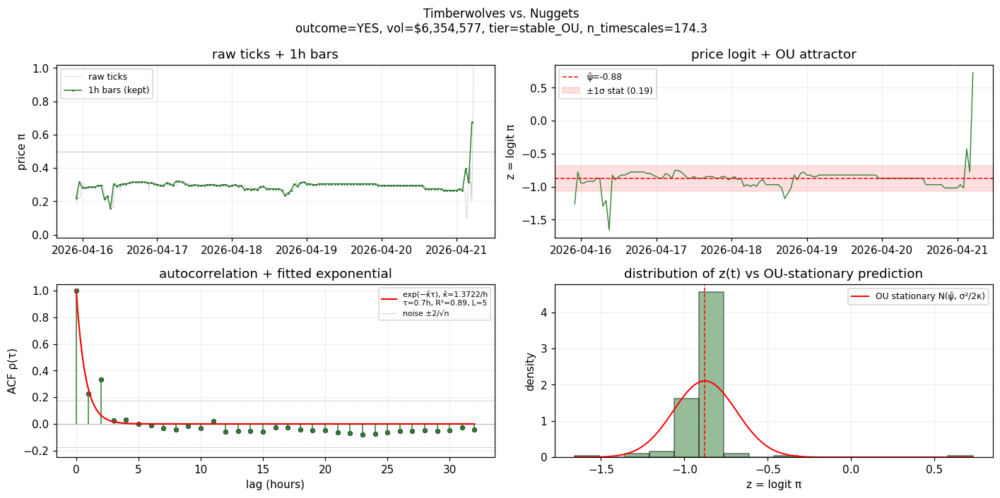

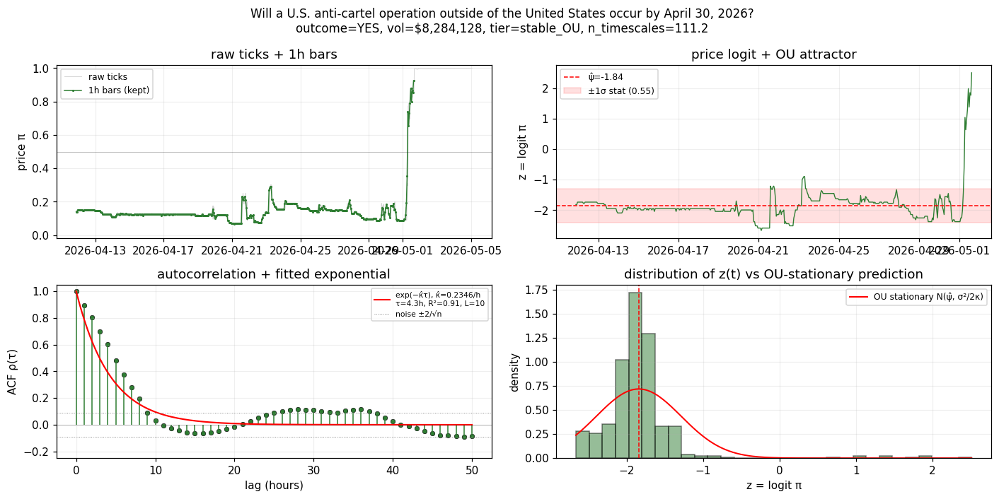

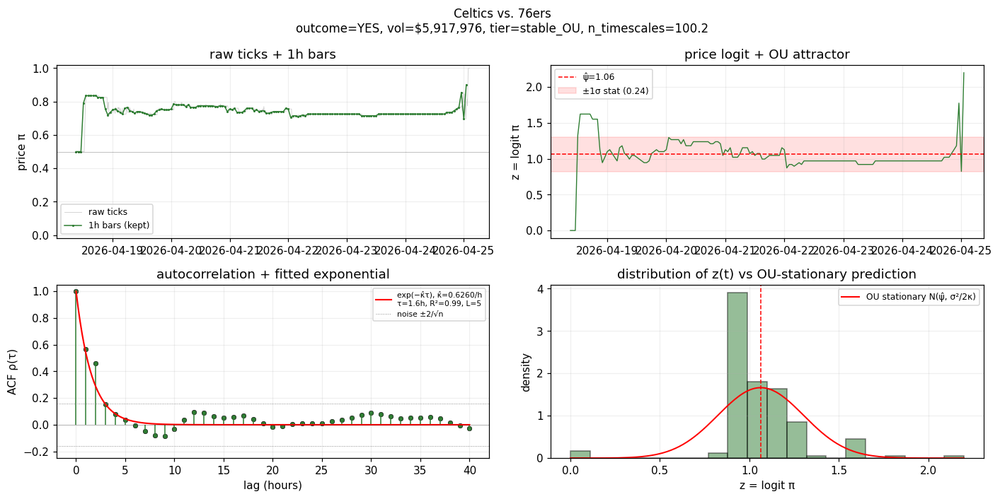

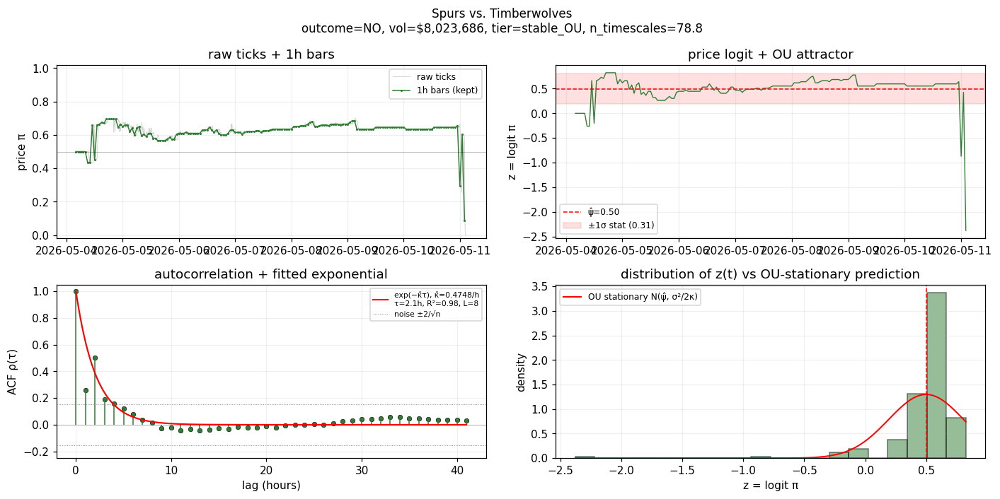

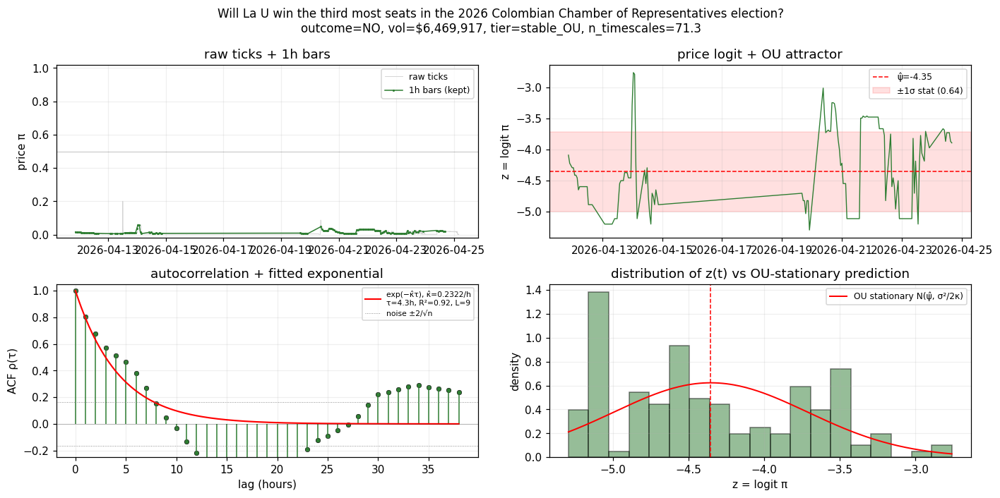

...

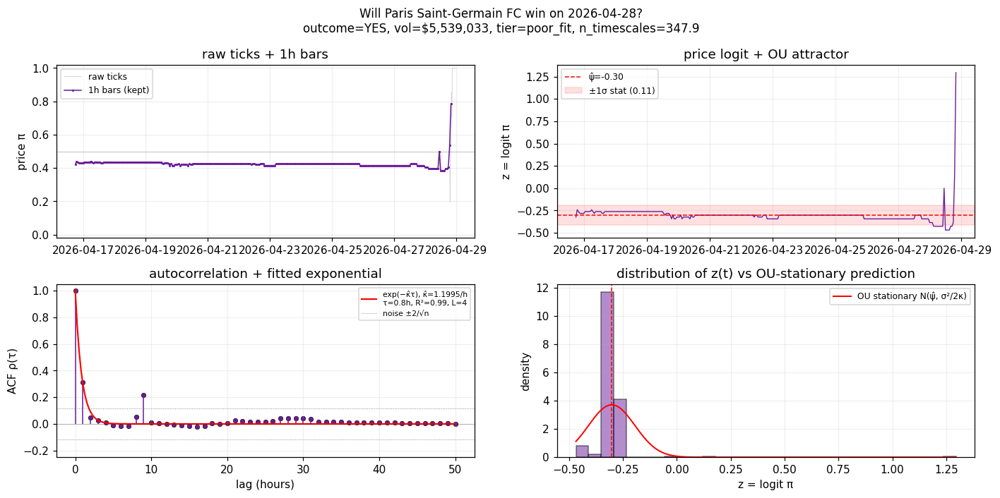

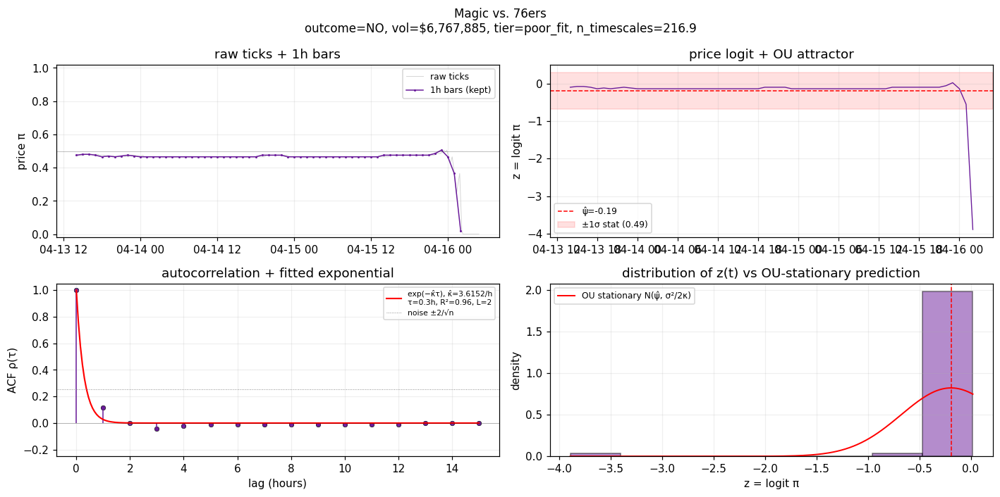

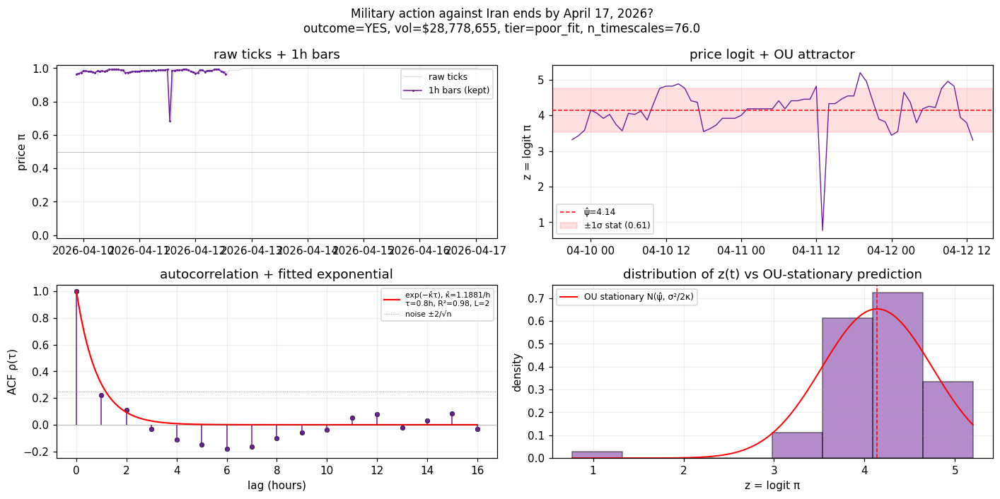

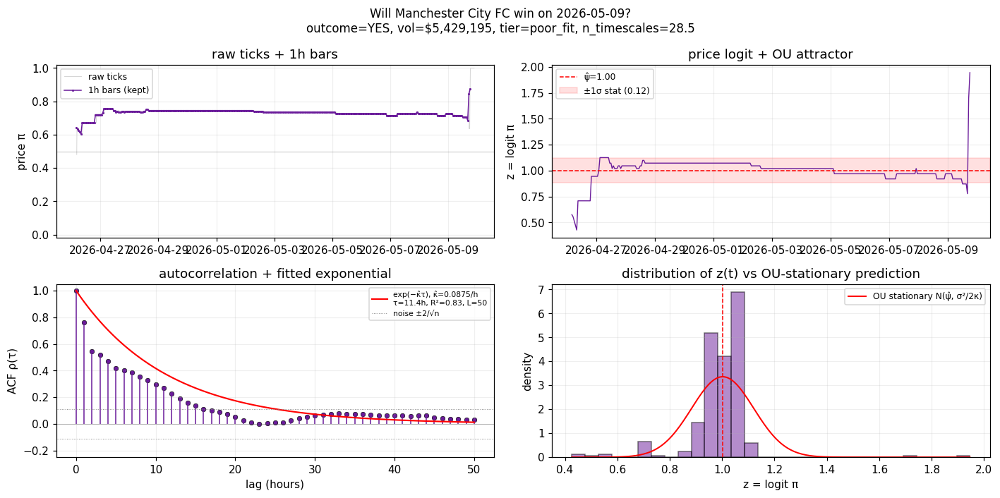

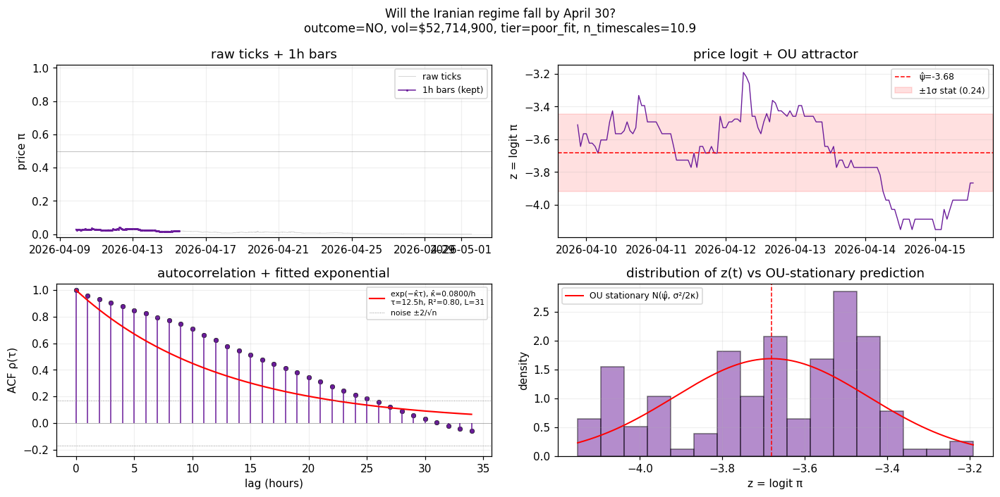

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


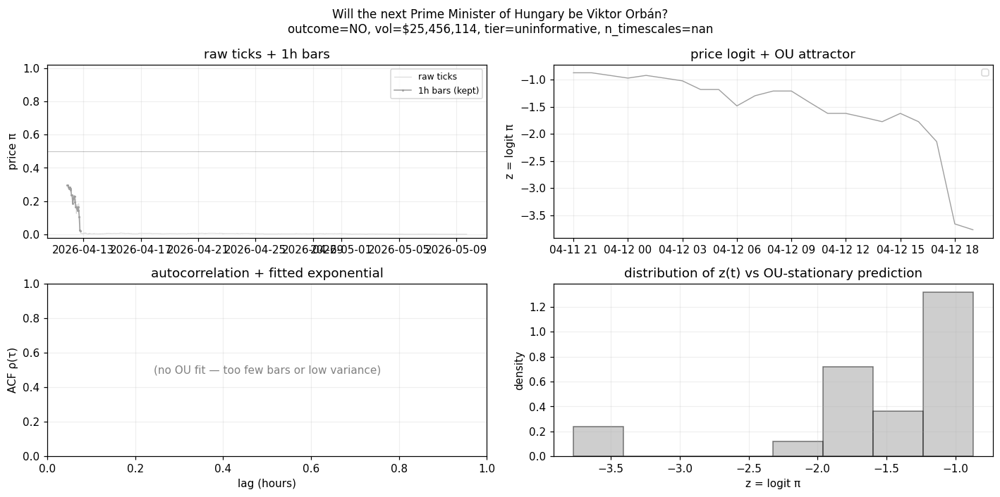

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


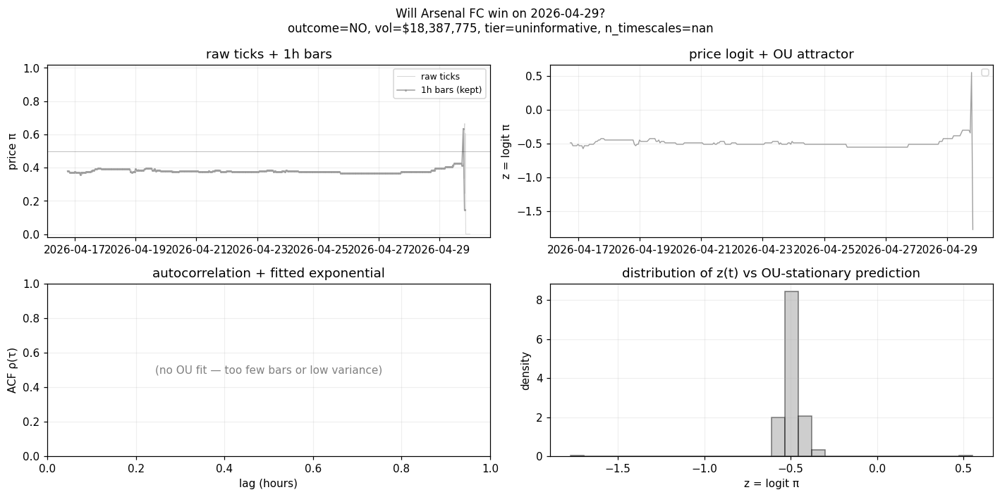

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


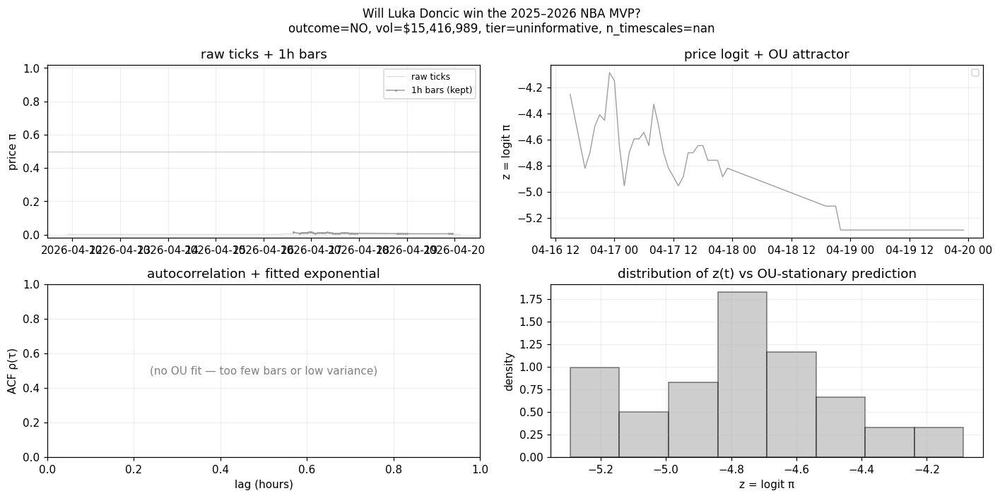

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


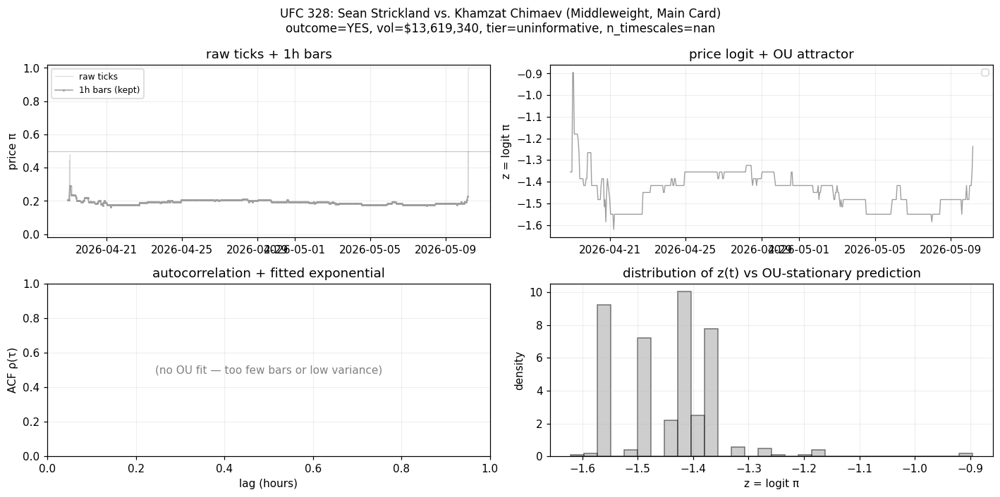

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


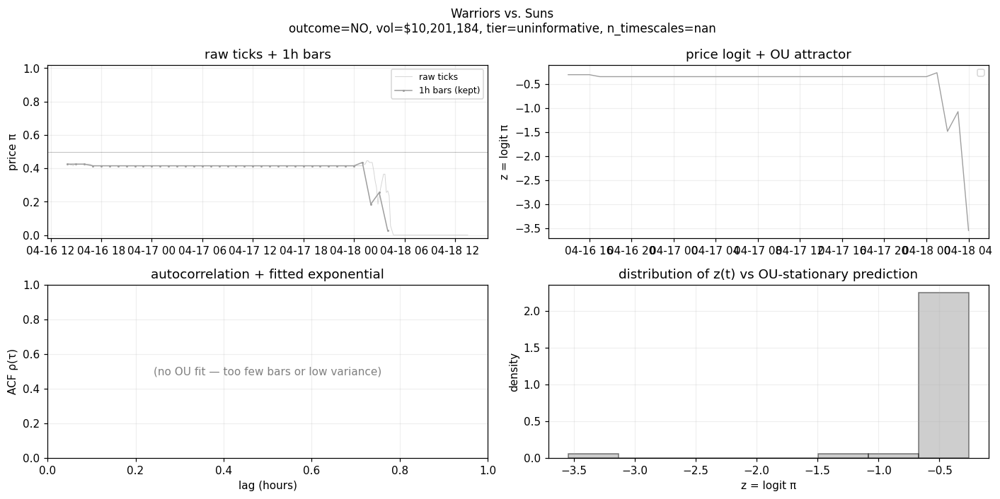

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


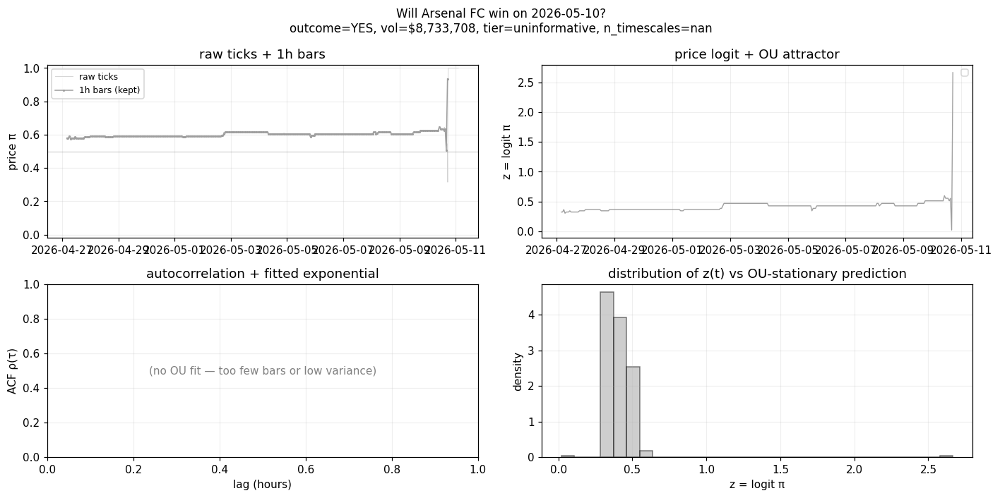

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


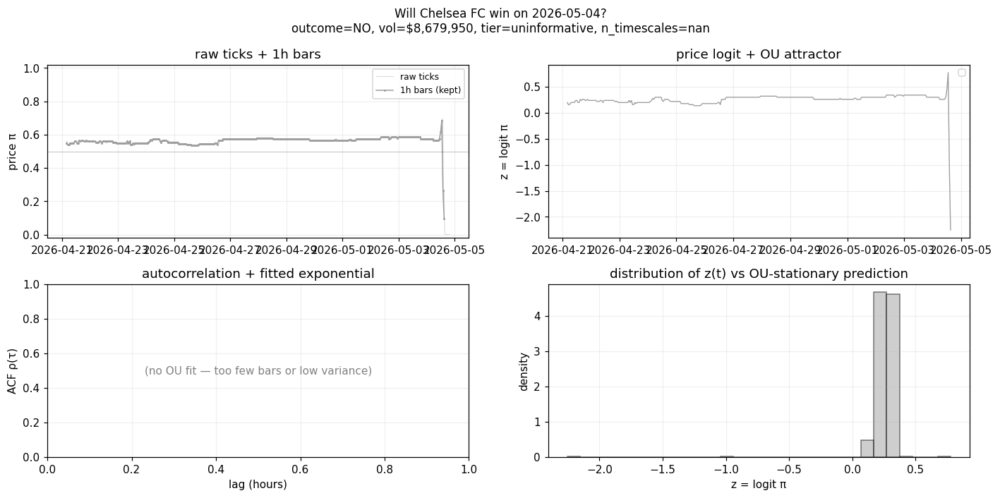

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


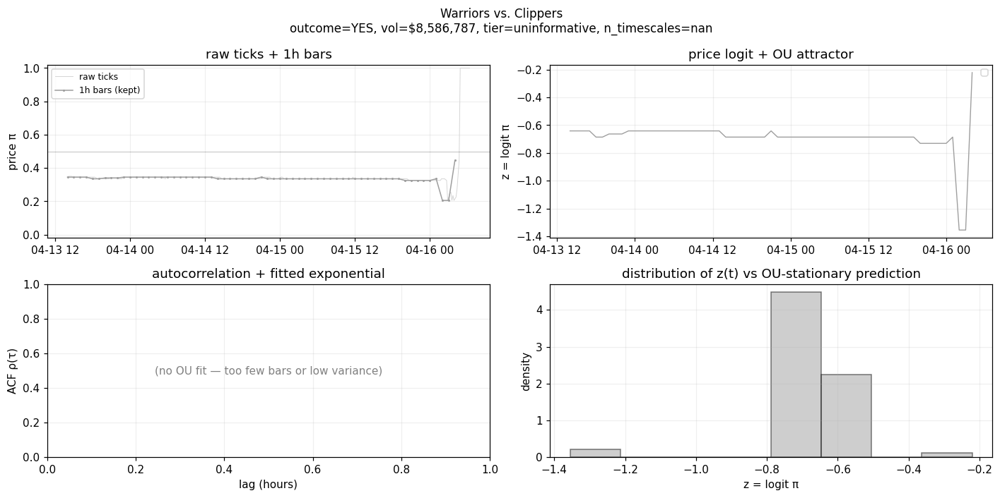

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


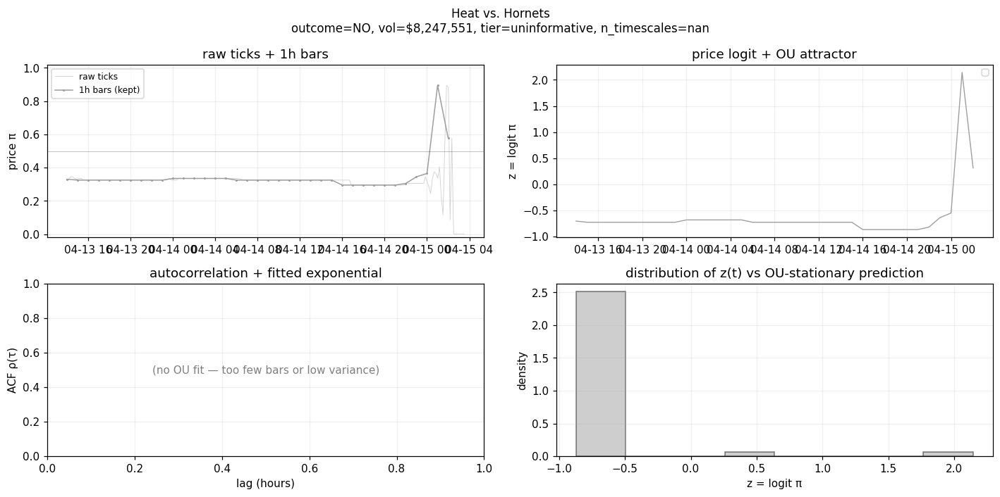

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


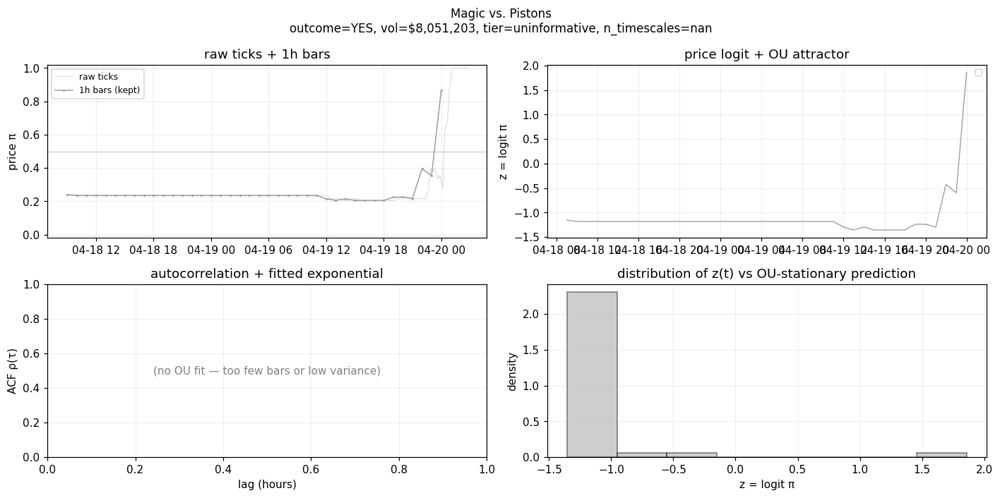

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


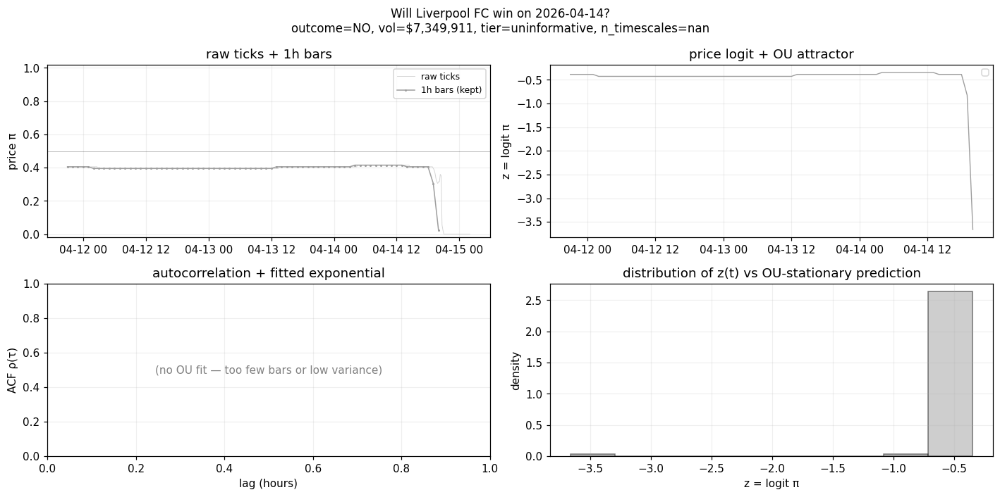

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


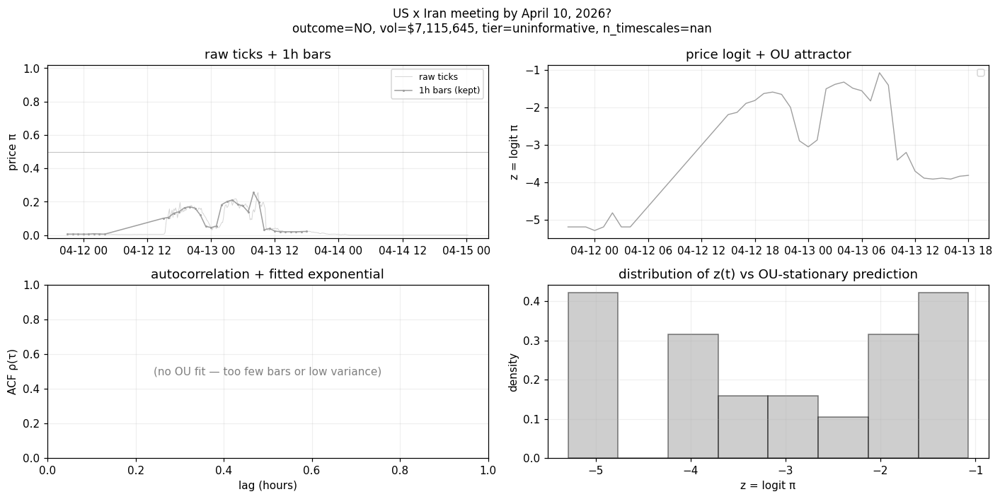

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


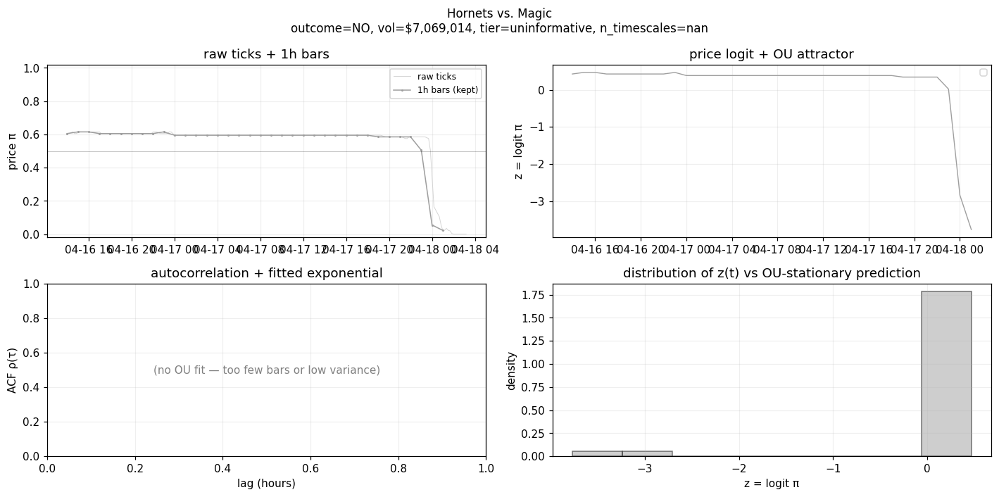

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


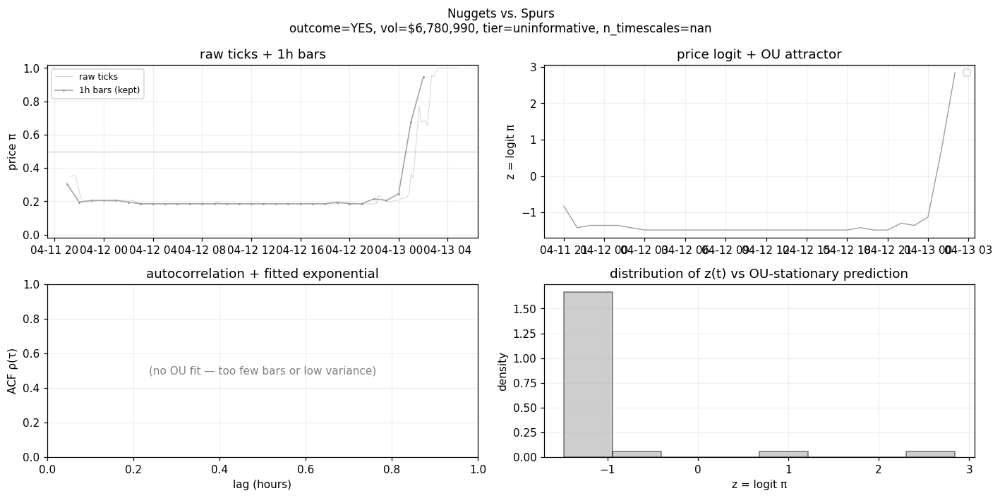

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


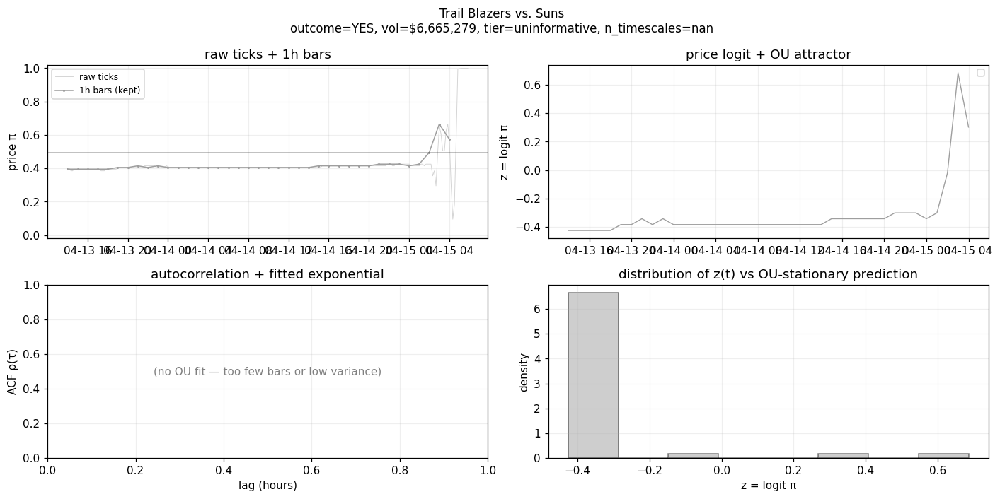

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


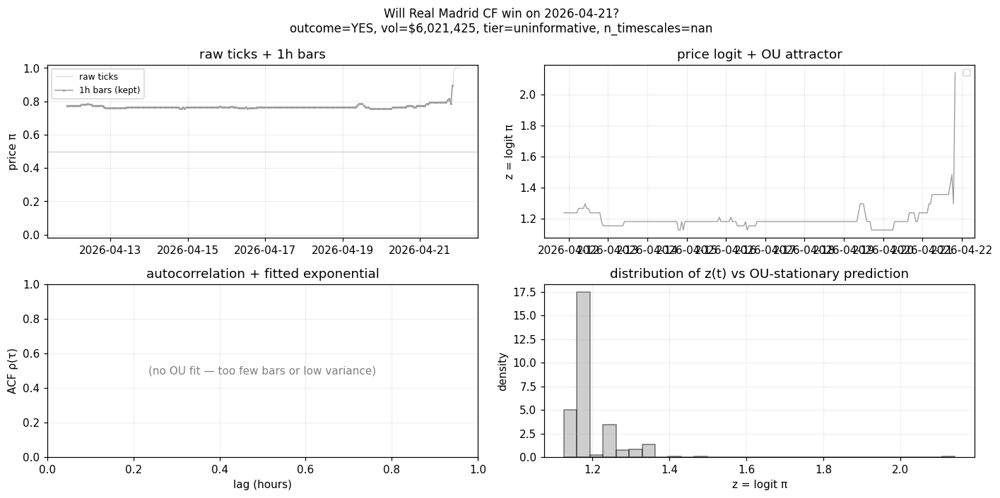

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


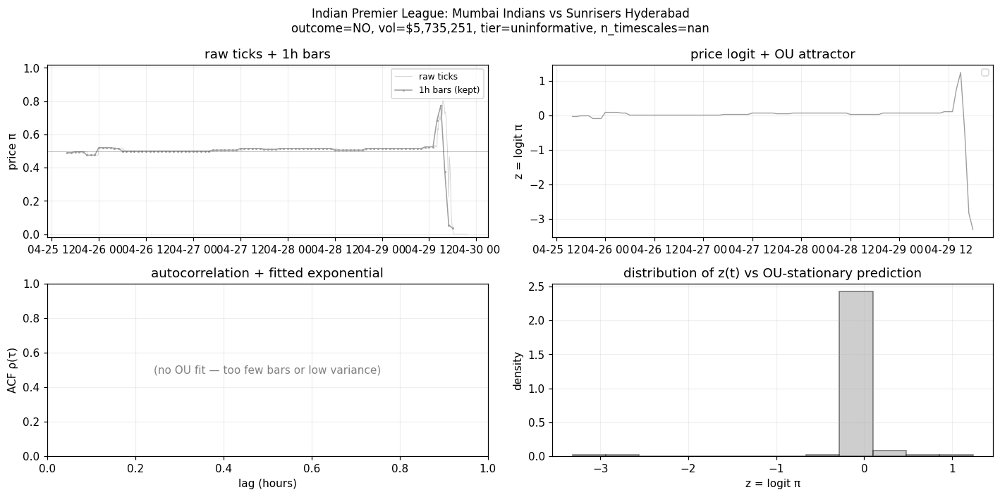

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


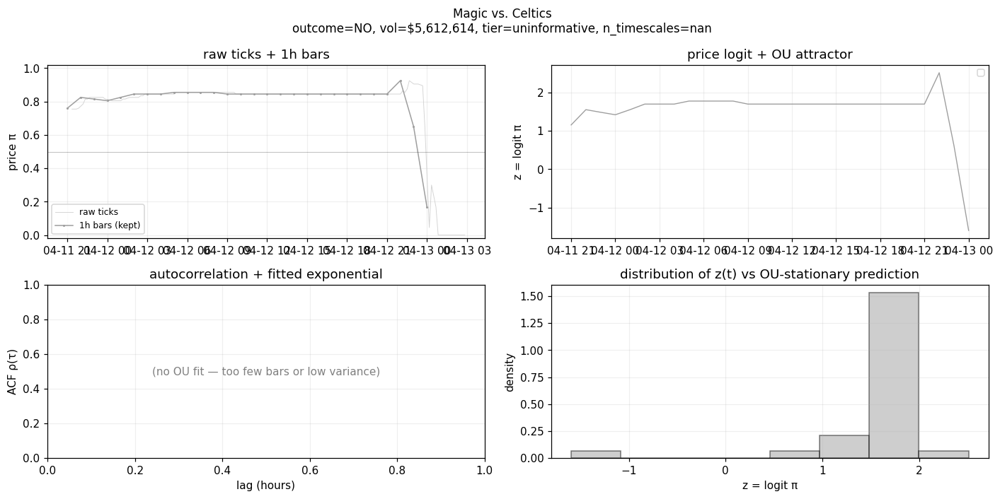

/var/folders/00/59y7_c3126574lh_hwc6s1km0000gn/T/ipykernel_27328/916938749.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=8)


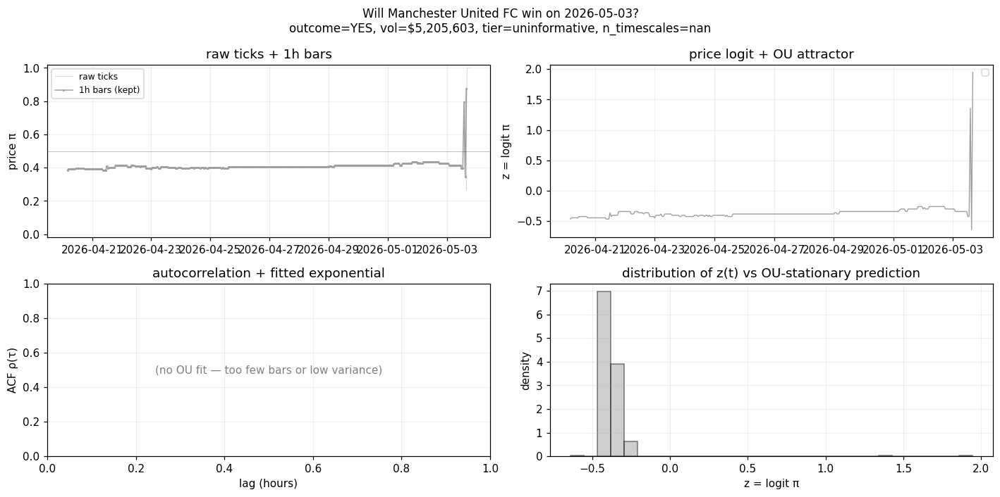

In [14]:
# Render every viewable market in tier order.
for _, row in viewable.iterrows():
    fig = plot_market_detail(row['token_id'])
    plt.show()
    plt.close(fig)

## Look at one market

Edit the cell below to inspect a single market by index in the table (row 0 is the top-ranked one, etc.).

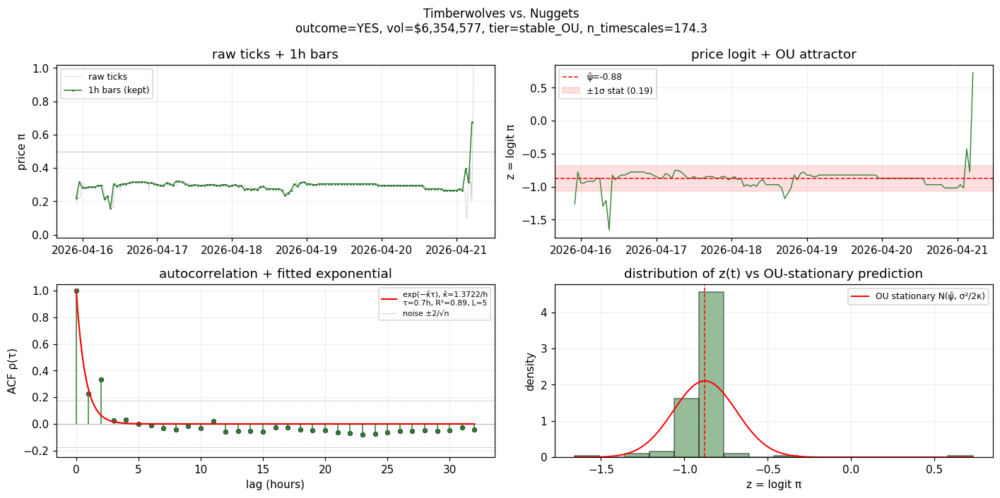

In [15]:
INDEX = 0  # change me
token = df.iloc[INDEX]['token_id']
plot_market_detail(token)
plt.show()